# <center> <b> <h1> Random Forest (Features - Parameters - Tuning) </h1></b></center>

In [43]:
import matplotlib.pyplot as plt
import numpy as np

from concurrent import futures
from concurrent.futures import ProcessPoolExecutor

from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.externals import joblib

import pandas as pd
import itertools

PATH_DATASETS = "../../2_Data_preparation/2_Split_Raw_Datasets/output/"
PATH_PKL = "/../../3 Modeling/1. Random Forest ( All features)/output/"
PATH_SIGNIFICANCE = "../../3 Modeling/2. Random Forest (significance Score)/output/"

In [2]:
def readCsvs(split):
    datasets = []
    constant1 = 'X_'
    constant2 = '_' + split
    features = ['area', 'meancurv', 'thickness', 'volume']

    for feature in features:
        df = pd.read_csv(PATH_DATASETS + constant1 + feature + constant2 +'.csv', index_col=0)
        datasets.append({'name': feature, 'data': df})
    return datasets

In [3]:
def readClf():
    randomForests = []
    constant1 = "RandomForest (AllFeatures) "
    features = ['area', 'meancurv', 'thickness', 'volume']

    for feature in features:
        clf = joblib.load(PATH_PKL + constant1 + feature + '.pkl')
        randomForests.append({'name': feature, 'data': clf})
        
    return randomForests

In [4]:
def readSignificances():
    df_number_of_features = pd.read_csv(PATH_SIGNIFICANCE 
                                        + "Random Forest Best Number Of Features.csv", index_col=0)
    
    datasets = []
    constant1 = 'Random Forest (AllFeatures - Significance - '
    constant2 = ')'
    features = ['area','meancurv', 'thickness', 'volume']
    number_of_feature = df_number_of_features['quantity'].values

    for feature, number in zip(features, number_of_feature):
        df = pd.read_csv(PATH_SIGNIFICANCE + constant1 + str(int(number)) + constant2 
                         + feature +'.csv', index_col=0)
        datasets.append({'name': feature[0], 'data': df})
    return datasets

In [5]:
def TrainRandomForest(df_X, df_y, n_estimators):
    #data = df_X['data']
    # create a random forest classifier
    # n_estimators : The number of trees in the forest.
    # n_jobs = -1 : use all the processors
    # oob_score = true: Whether to use out-of-bag samples to estimate the generalization accuracy.
    # verbose  = Controls the verbosity when fitting and predicting.
    clf = RandomForestClassifier(n_estimators=n_estimators, random_state=0, n_jobs=-1, oob_score=True, verbose=True)
    # Train the classifier
    oob_score = clf.fit(df_X, df_y['class'].values)
    
    return clf, oob_score.oob_score_

# 1. Prepare the data

In [6]:
Significances = readSignificances()
Significances[0]['data'].head()

,Significance
Name,
rh_G_and_S_cingul-Ant_area,0.020898
lh_S_temporal_sup_area,0.018332
rh_G_temporal_middle_area,0.017275
rh_S_temporal_sup_area,0.015924
lh_G_cuneus_area,0.015085


In [7]:
df_X_tr = readCsvs('train')
df_X_tr[0]['data'].shape

(550, 148)

In [8]:
df_y_tr = pd.read_csv(PATH_DATASETS + 'Y_train.csv', index_col = 0)
df_y_tr.shape

(550, 1)

In [9]:
df_X_val = readCsvs('validate')
df_X_val[0]['data'].shape

(338, 148)

In [10]:
df_y_val = pd.read_csv(PATH_DATASETS + 'Y_validate.csv', index_col = 0)
df_y_val.shape

(338, 1)

# 2. Grid Search

In [20]:
avg_per_feature = []

for train, significance in zip(df_X_tr, Significances):
    
    data_train = train['data']
    name = train['name']
    significance_train = significance['data']
    
    #n_estimators_list = [351, 501, 751, 1001, 10001] # number of trees inside the forest 
    avg_per_estimator = [] # average 

    for n_estimators in  range(5, 2500, 5):
        
        print(name + '\n')
        
        avg= []
        for i in range(0,5): # how many times you will do the same proces to verify the result. 10
            clf = RandomForestClassifier(n_estimators = n_estimators, 
                                        n_jobs= -1,
                                        verbose= False, oob_score= True)
            oob_score = clf.fit(data_train[significance_train.index.values].copy(), df_y_tr['class'].values)
            print(n_estimators, i, oob_score.oob_score_)
            avg.append(oob_score.oob_score_)

        avg_per_estimator.append({'n_estimators' : n_estimators, 'average' : np.mean(avg)})
    
    avg_per_feature.append({'name' : name, 'data' : avg_per_estimator})

area

5 0 0.6163636363636363


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


5 1 0.5963636363636363
5 2 0.6090909090909091


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


5 3 0.5818181818181818
5 4 0.6090909090909091
area



/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 0 0.6381818181818182
10 1 0.6527272727272727


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 2 0.6345454545454545
10 3 0.6381818181818182


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 4 0.6145454545454545
area

15 0 0.6654545454545454


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


15 1 0.6509090909090909
15 2 0.6654545454545454


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


15 3 0.6690909090909091
15 4 0.6709090909090909
area

20 0 0.6890909090909091
20 1 0.6709090909090909
20 2 0.6563636363636364
20 3 0.6927272727272727
20 4 0.6836363636363636
area

25 0 0.6927272727272727
25 1 0.6781818181818182
25 2 0.6818181818181818
25 3 0.7
25 4 0.6836363636363636
area

30 0 0.6981818181818182
30 1 0.6836363636363636
30 2 0.6945454545454546
30 3 0.6618181818181819
30 4 0.6763636363636364
area

35 0 0.7145454545454546
35 1 0.6945454545454546
35 2 0.7018181818181818
35 3 0.6909090909090909
35 4 0.6872727272727273
area

40 0 0.7127272727272728
40 1 0.6927272727272727
40 2 0.7109090909090909
40 3 0.6763636363636364
40 4 0.6854545454545454
area

45 0 0.6927272727272727
45 1 0.6890909090909091
45 2 0.6981818181818182
45 3 0.6963636363636364
45 4 0.6890909090909091
area

50 0 0.6927272727272727
50 1 0.7018181818181818
50 2 0.7072727272727273
50 3 0.6763636363636364
50 4 0.7109090909090909
area

55 0 0.7036363636363636
55 1 0.7
55 2 0.6781818181818182
55 3 0.7
55 4 0.687272

345 4 0.7236363636363636
area

350 0 0.7109090909090909
350 1 0.7181818181818181
350 2 0.7181818181818181
350 3 0.7109090909090909
350 4 0.7218181818181818
area

355 0 0.7109090909090909
355 1 0.7181818181818181
355 2 0.7090909090909091
355 3 0.7054545454545454
355 4 0.7109090909090909
area

360 0 0.7018181818181818
360 1 0.7072727272727273
360 2 0.7072727272727273
360 3 0.7109090909090909
360 4 0.7272727272727273
area

365 0 0.7018181818181818
365 1 0.7018181818181818
365 2 0.7127272727272728
365 3 0.7018181818181818
365 4 0.7018181818181818
area

370 0 0.7072727272727273
370 1 0.72
370 2 0.7054545454545454
370 3 0.7054545454545454
370 4 0.7
area

375 0 0.7127272727272728
375 1 0.7090909090909091
375 2 0.72
375 3 0.7145454545454546
375 4 0.7109090909090909
area

380 0 0.7181818181818181
380 1 0.7072727272727273
380 2 0.7036363636363636
380 3 0.7127272727272728
380 4 0.7072727272727273
area

385 0 0.7145454545454546
385 1 0.7090909090909091
385 2 0.7090909090909091
385 3 0.710909090909

680 0 0.7145454545454546
680 1 0.7072727272727273
680 2 0.7090909090909091
680 3 0.7218181818181818
680 4 0.7181818181818181
area

685 0 0.7090909090909091
685 1 0.7127272727272728
685 2 0.7109090909090909
685 3 0.7127272727272728
685 4 0.7054545454545454
area

690 0 0.7145454545454546
690 1 0.7236363636363636
690 2 0.7072727272727273
690 3 0.72
690 4 0.7090909090909091
area

695 0 0.7163636363636363
695 1 0.7145454545454546
695 2 0.7109090909090909
695 3 0.7181818181818181
695 4 0.72
area

700 0 0.7127272727272728
700 1 0.7127272727272728
700 2 0.7163636363636363
700 3 0.7090909090909091
700 4 0.7145454545454546
area

705 0 0.7145454545454546
705 1 0.7109090909090909
705 2 0.7054545454545454
705 3 0.7145454545454546
705 4 0.7163636363636363
area

710 0 0.7054545454545454
710 1 0.7145454545454546
710 2 0.72
710 3 0.7090909090909091
710 4 0.7
area

715 0 0.7090909090909091
715 1 0.7127272727272728
715 2 0.7181818181818181
715 3 0.7109090909090909
715 4 0.7127272727272728
area

720 0 0.7

1005 2 0.7109090909090909
1005 3 0.7181818181818181
1005 4 0.72
area

1010 0 0.7109090909090909
1010 1 0.7163636363636363
1010 2 0.7054545454545454
1010 3 0.72
1010 4 0.7036363636363636
area

1015 0 0.7145454545454546
1015 1 0.7163636363636363
1015 2 0.7090909090909091
1015 3 0.7127272727272728
1015 4 0.7145454545454546
area

1020 0 0.7127272727272728
1020 1 0.7163636363636363
1020 2 0.7109090909090909
1020 3 0.7127272727272728
1020 4 0.7127272727272728
area

1025 0 0.7163636363636363
1025 1 0.7181818181818181
1025 2 0.7218181818181818
1025 3 0.7163636363636363
1025 4 0.7145454545454546
area

1030 0 0.7163636363636363
1030 1 0.7072727272727273
1030 2 0.7145454545454546
1030 3 0.7090909090909091
1030 4 0.7163636363636363
area

1035 0 0.7181818181818181
1035 1 0.7145454545454546
1035 2 0.7127272727272728
1035 3 0.7054545454545454
1035 4 0.7145454545454546
area

1040 0 0.7145454545454546
1040 1 0.7109090909090909
1040 2 0.7145454545454546
1040 3 0.7181818181818181
1040 4 0.710909090909090

1320 0 0.7163636363636363
1320 1 0.7145454545454546
1320 2 0.7072727272727273
1320 3 0.7145454545454546
1320 4 0.7145454545454546
area

1325 0 0.7090909090909091
1325 1 0.7127272727272728
1325 2 0.72
1325 3 0.7054545454545454
1325 4 0.72
area

1330 0 0.7163636363636363
1330 1 0.7127272727272728
1330 2 0.7090909090909091
1330 3 0.7145454545454546
1330 4 0.7145454545454546
area

1335 0 0.7109090909090909
1335 1 0.7236363636363636
1335 2 0.7163636363636363
1335 3 0.7109090909090909
1335 4 0.7036363636363636
area

1340 0 0.7181818181818181
1340 1 0.7109090909090909
1340 2 0.7054545454545454
1340 3 0.7181818181818181
1340 4 0.7127272727272728
area

1345 0 0.7163636363636363
1345 1 0.7090909090909091
1345 2 0.7090909090909091
1345 3 0.7090909090909091
1345 4 0.7181818181818181
area

1350 0 0.7145454545454546
1350 1 0.7163636363636363
1350 2 0.7181818181818181
1350 3 0.7090909090909091
1350 4 0.7163636363636363
area

1355 0 0.7254545454545455
1355 1 0.7127272727272728
1355 2 0.72
1355 3 0.723

1630 4 0.7090909090909091
area

1635 0 0.7090909090909091
1635 1 0.7163636363636363
1635 2 0.7163636363636363
1635 3 0.7072727272727273
1635 4 0.7090909090909091
area

1640 0 0.7218181818181818
1640 1 0.7072727272727273
1640 2 0.7163636363636363
1640 3 0.7018181818181818
1640 4 0.7127272727272728
area

1645 0 0.7181818181818181
1645 1 0.7181818181818181
1645 2 0.7090909090909091
1645 3 0.7163636363636363
1645 4 0.72
area

1650 0 0.7181818181818181
1650 1 0.7054545454545454
1650 2 0.7127272727272728
1650 3 0.7109090909090909
1650 4 0.7163636363636363
area

1655 0 0.7109090909090909
1655 1 0.7181818181818181
1655 2 0.7163636363636363
1655 3 0.7236363636363636
1655 4 0.7072727272727273
area

1660 0 0.7109090909090909
1660 1 0.72
1660 2 0.7072727272727273
1660 3 0.72
1660 4 0.7163636363636363
area

1665 0 0.7145454545454546
1665 1 0.7127272727272728
1665 2 0.7109090909090909
1665 3 0.7145454545454546
1665 4 0.7163636363636363
area

1670 0 0.7145454545454546
1670 1 0.7236363636363636
1670 2

1950 0 0.7127272727272728
1950 1 0.7181818181818181
1950 2 0.7218181818181818
1950 3 0.7036363636363636
1950 4 0.7090909090909091
area

1955 0 0.7109090909090909
1955 1 0.7072727272727273
1955 2 0.7090909090909091
1955 3 0.7181818181818181
1955 4 0.7163636363636363
area

1960 0 0.7145454545454546
1960 1 0.7218181818181818
1960 2 0.7218181818181818
1960 3 0.7109090909090909
1960 4 0.7163636363636363
area

1965 0 0.7181818181818181
1965 1 0.7163636363636363
1965 2 0.7145454545454546
1965 3 0.7036363636363636
1965 4 0.7145454545454546
area

1970 0 0.7109090909090909
1970 1 0.7163636363636363
1970 2 0.7090909090909091
1970 3 0.7109090909090909
1970 4 0.7163636363636363
area

1975 0 0.7181818181818181
1975 1 0.7127272727272728
1975 2 0.7109090909090909
1975 3 0.7109090909090909
1975 4 0.7218181818181818
area

1980 0 0.7145454545454546
1980 1 0.7218181818181818
1980 2 0.7090909090909091
1980 3 0.7145454545454546
1980 4 0.7127272727272728
area

1985 0 0.7054545454545454
1985 1 0.7218181818181

2265 2 0.7163636363636363
2265 3 0.72
2265 4 0.7145454545454546
area

2270 0 0.7163636363636363
2270 1 0.7145454545454546
2270 2 0.7181818181818181
2270 3 0.7145454545454546
2270 4 0.7145454545454546
area

2275 0 0.7272727272727273
2275 1 0.7109090909090909
2275 2 0.7181818181818181
2275 3 0.7181818181818181
2275 4 0.7109090909090909
area

2280 0 0.7145454545454546
2280 1 0.7163636363636363
2280 2 0.7090909090909091
2280 3 0.7163636363636363
2280 4 0.7127272727272728
area

2285 0 0.7109090909090909
2285 1 0.7072727272727273
2285 2 0.7054545454545454
2285 3 0.7127272727272728
2285 4 0.7163636363636363
area

2290 0 0.7145454545454546
2290 1 0.7090909090909091
2290 2 0.72
2290 3 0.7163636363636363
2290 4 0.7163636363636363
area

2295 0 0.7236363636363636
2295 1 0.7181818181818181
2295 2 0.7109090909090909
2295 3 0.72
2295 4 0.7145454545454546
area

2300 0 0.7109090909090909
2300 1 0.72
2300 2 0.72
2300 3 0.7145454545454546
2300 4 0.7090909090909091
area

2305 0 0.7163636363636363
2305 1 0

/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


5 1 0.5690909090909091
5 2 0.5654545454545454


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


5 3 0.5654545454545454
5 4 0.5636363636363636
meancurv



/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 0 0.5509090909090909
10 1 0.5763636363636364


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 2 0.5709090909090909
10 3 0.6072727272727273


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 4 0.5672727272727273
meancurv

15 0 0.6018181818181818


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


15 1 0.5709090909090909
15 2 0.5909090909090909


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


15 3 0.6472727272727272
15 4 0.5690909090909091
meancurv

20 0 0.6181818181818182
20 1 0.6145454545454545
20 2 0.5654545454545454
20 3 0.5890909090909091
20 4 0.5909090909090909
meancurv

25 0 0.5709090909090909
25 1 0.6236363636363637
25 2 0.6381818181818182
25 3 0.6218181818181818
25 4 0.5781818181818181
meancurv

30 0 0.5727272727272728
30 1 0.6363636363636364
30 2 0.5927272727272728
30 3 0.6090909090909091
30 4 0.6509090909090909
meancurv

35 0 0.5781818181818181
35 1 0.6036363636363636
35 2 0.6054545454545455
35 3 0.6036363636363636
35 4 0.5963636363636363
meancurv

40 0 0.6509090909090909
40 1 0.6254545454545455
40 2 0.6363636363636364
40 3 0.58
40 4 0.6709090909090909
meancurv

45 0 0.6418181818181818
45 1 0.6418181818181818
45 2 0.6345454545454545
45 3 0.6563636363636364
45 4 0.610909090909091
meancurv

50 0 0.6218181818181818
50 1 0.6272727272727273
50 2 0.6654545454545454
50 3 0.62
50 4 0.6472727272727272
meancurv

55 0 0.6509090909090909
55 1 0.6418181818181818
55 2 0.629090

340 3 0.6763636363636364
340 4 0.6727272727272727
meancurv

345 0 0.6818181818181818
345 1 0.6927272727272727
345 2 0.6527272727272727
345 3 0.6690909090909091
345 4 0.6818181818181818
meancurv

350 0 0.6745454545454546
350 1 0.6745454545454546
350 2 0.68
350 3 0.6818181818181818
350 4 0.68
meancurv

355 0 0.68
355 1 0.6745454545454546
355 2 0.6836363636363636
355 3 0.6781818181818182
355 4 0.6672727272727272
meancurv

360 0 0.6872727272727273
360 1 0.6545454545454545
360 2 0.68
360 3 0.6745454545454546
360 4 0.6727272727272727
meancurv

365 0 0.68
365 1 0.6854545454545454
365 2 0.6854545454545454
365 3 0.6654545454545454
365 4 0.6836363636363636
meancurv

370 0 0.6690909090909091
370 1 0.6836363636363636
370 2 0.6636363636363637
370 3 0.6890909090909091
370 4 0.68
meancurv

375 0 0.6727272727272727
375 1 0.6854545454545454
375 2 0.6690909090909091
375 3 0.6745454545454546
375 4 0.6854545454545454
meancurv

380 0 0.6872727272727273
380 1 0.6945454545454546
380 2 0.6727272727272727
380 

665 1 0.6890909090909091
665 2 0.6763636363636364
665 3 0.6836363636363636
665 4 0.6836363636363636
meancurv

670 0 0.68
670 1 0.6836363636363636
670 2 0.6909090909090909
670 3 0.6909090909090909
670 4 0.6690909090909091
meancurv

675 0 0.6818181818181818
675 1 0.6945454545454546
675 2 0.6890909090909091
675 3 0.6854545454545454
675 4 0.6672727272727272
meancurv

680 0 0.6909090909090909
680 1 0.6781818181818182
680 2 0.6781818181818182
680 3 0.6872727272727273
680 4 0.6836363636363636
meancurv

685 0 0.6781818181818182
685 1 0.6945454545454546
685 2 0.6890909090909091
685 3 0.6890909090909091
685 4 0.6763636363636364
meancurv

690 0 0.6872727272727273
690 1 0.6890909090909091
690 2 0.6727272727272727
690 3 0.6981818181818182
690 4 0.68
meancurv

695 0 0.6763636363636364
695 1 0.6872727272727273
695 2 0.6909090909090909
695 3 0.6872727272727273
695 4 0.6727272727272727
meancurv

700 0 0.6854545454545454
700 1 0.6745454545454546
700 2 0.6836363636363636
700 3 0.6945454545454546
700 4 0.

985 1 0.6909090909090909
985 2 0.6981818181818182
985 3 0.6745454545454546
985 4 0.6981818181818182
meancurv

990 0 0.6781818181818182
990 1 0.6872727272727273
990 2 0.68
990 3 0.68
990 4 0.6872727272727273
meancurv

995 0 0.6927272727272727
995 1 0.6854545454545454
995 2 0.6727272727272727
995 3 0.6890909090909091
995 4 0.6709090909090909
meancurv

1000 0 0.6963636363636364
1000 1 0.6854545454545454
1000 2 0.6909090909090909
1000 3 0.6945454545454546
1000 4 0.6854545454545454
meancurv

1005 0 0.6836363636363636
1005 1 0.6854545454545454
1005 2 0.6927272727272727
1005 3 0.6927272727272727
1005 4 0.6927272727272727
meancurv

1010 0 0.6854545454545454
1010 1 0.6763636363636364
1010 2 0.6836363636363636
1010 3 0.6709090909090909
1010 4 0.6745454545454546
meancurv

1015 0 0.6945454545454546
1015 1 0.6763636363636364
1015 2 0.6872727272727273
1015 3 0.6927272727272727
1015 4 0.6709090909090909
meancurv

1020 0 0.6890909090909091
1020 1 0.7
1020 2 0.6836363636363636
1020 3 0.6872727272727273

1290 0 0.7036363636363636
1290 1 0.6890909090909091
1290 2 0.6781818181818182
1290 3 0.6890909090909091
1290 4 0.6781818181818182
meancurv

1295 0 0.6854545454545454
1295 1 0.6963636363636364
1295 2 0.6981818181818182
1295 3 0.6836363636363636
1295 4 0.6727272727272727
meancurv

1300 0 0.6745454545454546
1300 1 0.6854545454545454
1300 2 0.7090909090909091
1300 3 0.6981818181818182
1300 4 0.6981818181818182
meancurv

1305 0 0.6818181818181818
1305 1 0.6854545454545454
1305 2 0.6890909090909091
1305 3 0.6927272727272727
1305 4 0.6909090909090909
meancurv

1310 0 0.7018181818181818
1310 1 0.6945454545454546
1310 2 0.6872727272727273
1310 3 0.6890909090909091
1310 4 0.6963636363636364
meancurv

1315 0 0.6818181818181818
1315 1 0.6854545454545454
1315 2 0.6854545454545454
1315 3 0.6890909090909091
1315 4 0.6890909090909091
meancurv

1320 0 0.7
1320 1 0.6836363636363636
1320 2 0.6909090909090909
1320 3 0.6872727272727273
1320 4 0.7018181818181818
meancurv

1325 0 0.6872727272727273
1325 1 0.

1600 0 0.7
1600 1 0.6836363636363636
1600 2 0.6854545454545454
1600 3 0.6890909090909091
1600 4 0.6963636363636364
meancurv

1605 0 0.6872727272727273
1605 1 0.6854545454545454
1605 2 0.6890909090909091
1605 3 0.6836363636363636
1605 4 0.7072727272727273
meancurv

1610 0 0.6890909090909091
1610 1 0.6818181818181818
1610 2 0.6890909090909091
1610 3 0.6854545454545454
1610 4 0.6745454545454546
meancurv

1615 0 0.6890909090909091
1615 1 0.6927272727272727
1615 2 0.6872727272727273
1615 3 0.6909090909090909
1615 4 0.7036363636363636
meancurv

1620 0 0.6945454545454546
1620 1 0.6836363636363636
1620 2 0.6963636363636364
1620 3 0.6945454545454546
1620 4 0.6945454545454546
meancurv

1625 0 0.6945454545454546
1625 1 0.6890909090909091
1625 2 0.6927272727272727
1625 3 0.6872727272727273
1625 4 0.6872727272727273
meancurv

1630 0 0.6763636363636364
1630 1 0.6909090909090909
1630 2 0.6836363636363636
1630 3 0.7
1630 4 0.6890909090909091
meancurv

1635 0 0.68
1635 1 0.6872727272727273
1635 2 0.689

1900 3 0.6981818181818182
1900 4 0.6945454545454546
meancurv

1905 0 0.6945454545454546
1905 1 0.6909090909090909
1905 2 0.6963636363636364
1905 3 0.6963636363636364
1905 4 0.6909090909090909
meancurv

1910 0 0.6909090909090909
1910 1 0.6854545454545454
1910 2 0.6945454545454546
1910 3 0.6981818181818182
1910 4 0.7018181818181818
meancurv

1915 0 0.6963636363636364
1915 1 0.6963636363636364
1915 2 0.6981818181818182
1915 3 0.6818181818181818
1915 4 0.6963636363636364
meancurv

1920 0 0.6818181818181818
1920 1 0.6854545454545454
1920 2 0.6818181818181818
1920 3 0.6854545454545454
1920 4 0.6981818181818182
meancurv

1925 0 0.7054545454545454
1925 1 0.6818181818181818
1925 2 0.6890909090909091
1925 3 0.6927272727272727
1925 4 0.6909090909090909
meancurv

1930 0 0.6927272727272727
1930 1 0.6981818181818182
1930 2 0.68
1930 3 0.6945454545454546
1930 4 0.7072727272727273
meancurv

1935 0 0.6890909090909091
1935 1 0.6963636363636364
1935 2 0.6854545454545454
1935 3 0.6945454545454546
1935 4 0

2205 4 0.6945454545454546
meancurv

2210 0 0.7018181818181818
2210 1 0.6981818181818182
2210 2 0.6981818181818182
2210 3 0.7054545454545454
2210 4 0.7018181818181818
meancurv

2215 0 0.6836363636363636
2215 1 0.6963636363636364
2215 2 0.6981818181818182
2215 3 0.6945454545454546
2215 4 0.6963636363636364
meancurv

2220 0 0.6909090909090909
2220 1 0.6818181818181818
2220 2 0.6890909090909091
2220 3 0.6836363636363636
2220 4 0.6945454545454546
meancurv

2225 0 0.6927272727272727
2225 1 0.6945454545454546
2225 2 0.68
2225 3 0.6872727272727273
2225 4 0.6872727272727273
meancurv

2230 0 0.7036363636363636
2230 1 0.6909090909090909
2230 2 0.7109090909090909
2230 3 0.7054545454545454
2230 4 0.6854545454545454
meancurv

2235 0 0.6872727272727273
2235 1 0.6836363636363636
2235 2 0.6872727272727273
2235 3 0.7018181818181818
2235 4 0.6890909090909091
meancurv

2240 0 0.6872727272727273
2240 1 0.6818181818181818
2240 2 0.6909090909090909
2240 3 0.6981818181818182
2240 4 0.6945454545454546
meancurv

/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


5 1 0.5236363636363637
5 2 0.5254545454545455


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


5 3 0.5545454545454546
5 4 0.5436363636363636
thickness



/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 0 0.6018181818181818
10 1 0.5563636363636364


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 2 0.6181818181818182
10 3 0.5545454545454546


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 4 0.5781818181818181
thickness

15 0 0.5854545454545454


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


15 1 0.5654545454545454
15 2 0.6272727272727273


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


15 3 0.5927272727272728
15 4 0.5654545454545454
thickness

20 0 0.6054545454545455
20 1 0.6
20 2 0.5854545454545454
20 3 0.5781818181818181


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


20 4 0.5890909090909091
thickness

25 0 0.6127272727272727
25 1 0.5927272727272728
25 2 0.5981818181818181
25 3 0.5872727272727273
25 4 0.5909090909090909
thickness

30 0 0.610909090909091
30 1 0.5981818181818181
30 2 0.5927272727272728
30 3 0.5854545454545454
30 4 0.62
thickness

35 0 0.649090909090909
35 1 0.6345454545454545
35 2 0.6509090909090909
35 3 0.6163636363636363
35 4 0.6436363636363637
thickness

40 0 0.6072727272727273
40 1 0.6127272727272727
40 2 0.6672727272727272
40 3 0.6418181818181818
40 4 0.6454545454545455
thickness

45 0 0.6672727272727272
45 1 0.6181818181818182
45 2 0.6127272727272727
45 3 0.6345454545454545
45 4 0.6272727272727273
thickness

50 0 0.6454545454545455
50 1 0.6072727272727273
50 2 0.6345454545454545
50 3 0.6090909090909091
50 4 0.6309090909090909
thickness

55 0 0.6454545454545455
55 1 0.6418181818181818
55 2 0.6381818181818182
55 3 0.6236363636363637
55 4 0.6472727272727272
thickness

60 0 0.6381818181818182
60 1 0.6054545454545455
60 2 0.623636363

335 2 0.6781818181818182
335 3 0.6690909090909091
335 4 0.6709090909090909
thickness

340 0 0.6709090909090909
340 1 0.6854545454545454
340 2 0.6618181818181819
340 3 0.7
340 4 0.6690909090909091
thickness

345 0 0.6927272727272727
345 1 0.68
345 2 0.6672727272727272
345 3 0.6818181818181818
345 4 0.6745454545454546
thickness

350 0 0.6927272727272727
350 1 0.6836363636363636
350 2 0.6818181818181818
350 3 0.6727272727272727
350 4 0.6836363636363636
thickness

355 0 0.6909090909090909
355 1 0.68
355 2 0.6690909090909091
355 3 0.6945454545454546
355 4 0.68
thickness

360 0 0.6854545454545454
360 1 0.6981818181818182
360 2 0.6909090909090909
360 3 0.6763636363636364
360 4 0.6763636363636364
thickness

365 0 0.6745454545454546
365 1 0.6909090909090909
365 2 0.6781818181818182
365 3 0.6654545454545454
365 4 0.6709090909090909
thickness

370 0 0.6818181818181818
370 1 0.6836363636363636
370 2 0.6836363636363636
370 3 0.6727272727272727
370 4 0.6581818181818182
thickness

375 0 0.69454545454

650 4 0.6745454545454546
thickness

655 0 0.6963636363636364
655 1 0.6872727272727273
655 2 0.6927272727272727
655 3 0.6890909090909091
655 4 0.6709090909090909
thickness

660 0 0.6945454545454546
660 1 0.6927272727272727
660 2 0.6781818181818182
660 3 0.6927272727272727
660 4 0.6781818181818182
thickness

665 0 0.6745454545454546
665 1 0.6872727272727273
665 2 0.6890909090909091
665 3 0.6872727272727273
665 4 0.6854545454545454
thickness

670 0 0.68
670 1 0.6927272727272727
670 2 0.7036363636363636
670 3 0.6709090909090909
670 4 0.6981818181818182
thickness

675 0 0.6981818181818182
675 1 0.6854545454545454
675 2 0.6636363636363637
675 3 0.6690909090909091
675 4 0.6727272727272727
thickness

680 0 0.7
680 1 0.6854545454545454
680 2 0.6745454545454546
680 3 0.6672727272727272
680 4 0.6836363636363636
thickness

685 0 0.6854545454545454
685 1 0.6909090909090909
685 2 0.6836363636363636
685 3 0.6745454545454546
685 4 0.6709090909090909
thickness

690 0 0.6818181818181818
690 1 0.67090909

965 4 0.6836363636363636
thickness

970 0 0.68
970 1 0.6727272727272727
970 2 0.6909090909090909
970 3 0.6872727272727273
970 4 0.6909090909090909
thickness

975 0 0.6709090909090909
975 1 0.6818181818181818
975 2 0.6909090909090909
975 3 0.6672727272727272
975 4 0.6818181818181818
thickness

980 0 0.6909090909090909
980 1 0.6890909090909091
980 2 0.6836363636363636
980 3 0.6854545454545454
980 4 0.6709090909090909
thickness

985 0 0.6890909090909091
985 1 0.7036363636363636
985 2 0.6909090909090909
985 3 0.6909090909090909
985 4 0.6781818181818182
thickness

990 0 0.6927272727272727
990 1 0.6872727272727273
990 2 0.6981818181818182
990 3 0.7018181818181818
990 4 0.6763636363636364
thickness

995 0 0.6963636363636364
995 1 0.6927272727272727
995 2 0.6818181818181818
995 3 0.6890909090909091
995 4 0.6763636363636364
thickness

1000 0 0.6727272727272727
1000 1 0.6763636363636364
1000 2 0.6890909090909091
1000 3 0.6872727272727273
1000 4 0.6836363636363636
thickness

1005 0 0.68
1005 1 0.

1270 3 0.6909090909090909
1270 4 0.6672727272727272
thickness

1275 0 0.6872727272727273
1275 1 0.6836363636363636
1275 2 0.6854545454545454
1275 3 0.6909090909090909
1275 4 0.6854545454545454
thickness

1280 0 0.6927272727272727
1280 1 0.6890909090909091
1280 2 0.6818181818181818
1280 3 0.6854545454545454
1280 4 0.7
thickness

1285 0 0.6818181818181818
1285 1 0.6763636363636364
1285 2 0.6927272727272727
1285 3 0.6927272727272727
1285 4 0.6945454545454546
thickness

1290 0 0.6854545454545454
1290 1 0.6854545454545454
1290 2 0.6872727272727273
1290 3 0.6818181818181818
1290 4 0.6927272727272727
thickness

1295 0 0.6854545454545454
1295 1 0.6890909090909091
1295 2 0.6854545454545454
1295 3 0.6818181818181818
1295 4 0.6890909090909091
thickness

1300 0 0.6927272727272727
1300 1 0.6872727272727273
1300 2 0.7036363636363636
1300 3 0.6745454545454546
1300 4 0.6927272727272727
thickness

1305 0 0.68
1305 1 0.6890909090909091
1305 2 0.6872727272727273
1305 3 0.6963636363636364
1305 4 0.6854545

1575 2 0.6927272727272727
1575 3 0.6854545454545454
1575 4 0.6836363636363636
thickness

1580 0 0.6854545454545454
1580 1 0.6854545454545454
1580 2 0.6872727272727273
1580 3 0.6909090909090909
1580 4 0.6927272727272727
thickness

1585 0 0.68
1585 1 0.6890909090909091
1585 2 0.6818181818181818
1585 3 0.6781818181818182
1585 4 0.7
thickness

1590 0 0.6781818181818182
1590 1 0.6854545454545454
1590 2 0.6818181818181818
1590 3 0.6836363636363636
1590 4 0.6890909090909091
thickness

1595 0 0.6709090909090909
1595 1 0.6890909090909091
1595 2 0.6709090909090909
1595 3 0.6872727272727273
1595 4 0.6763636363636364
thickness

1600 0 0.6890909090909091
1600 1 0.6836363636363636
1600 2 0.6818181818181818
1600 3 0.6836363636363636
1600 4 0.6872727272727273
thickness

1605 0 0.6872727272727273
1605 1 0.7018181818181818
1605 2 0.6927272727272727
1605 3 0.7
1605 4 0.6872727272727273
thickness

1610 0 0.6872727272727273
1610 1 0.6763636363636364
1610 2 0.6818181818181818
1610 3 0.6945454545454546
1610 

1880 1 0.6963636363636364
1880 2 0.6872727272727273
1880 3 0.6818181818181818
1880 4 0.6981818181818182
thickness

1885 0 0.6818181818181818
1885 1 0.6963636363636364
1885 2 0.6963636363636364
1885 3 0.6872727272727273
1885 4 0.6872727272727273
thickness

1890 0 0.6672727272727272
1890 1 0.6909090909090909
1890 2 0.6890909090909091
1890 3 0.6909090909090909
1890 4 0.6836363636363636
thickness

1895 0 0.6945454545454546
1895 1 0.6836363636363636
1895 2 0.6872727272727273
1895 3 0.6854545454545454
1895 4 0.6836363636363636
thickness

1900 0 0.68
1900 1 0.6872727272727273
1900 2 0.6872727272727273
1900 3 0.6890909090909091
1900 4 0.6945454545454546
thickness

1905 0 0.6890909090909091
1905 1 0.6890909090909091
1905 2 0.6927272727272727
1905 3 0.6781818181818182
1905 4 0.6945454545454546
thickness

1910 0 0.6927272727272727
1910 1 0.6890909090909091
1910 2 0.6854545454545454
1910 3 0.6854545454545454
1910 4 0.6890909090909091
thickness

1915 0 0.6745454545454546
1915 1 0.6945454545454546
1

2180 4 0.6890909090909091
thickness

2185 0 0.7
2185 1 0.7
2185 2 0.6872727272727273
2185 3 0.7018181818181818
2185 4 0.6945454545454546
thickness

2190 0 0.6690909090909091
2190 1 0.6927272727272727
2190 2 0.6818181818181818
2190 3 0.6872727272727273
2190 4 0.6872727272727273
thickness

2195 0 0.6981818181818182
2195 1 0.6872727272727273
2195 2 0.6890909090909091
2195 3 0.6854545454545454
2195 4 0.6745454545454546
thickness

2200 0 0.6927272727272727
2200 1 0.68
2200 2 0.6909090909090909
2200 3 0.6963636363636364
2200 4 0.7036363636363636
thickness

2205 0 0.6709090909090909
2205 1 0.6818181818181818
2205 2 0.6854545454545454
2205 3 0.6927272727272727
2205 4 0.6836363636363636
thickness

2210 0 0.6836363636363636
2210 1 0.6890909090909091
2210 2 0.6909090909090909
2210 3 0.6927272727272727
2210 4 0.6745454545454546
thickness

2215 0 0.6945454545454546
2215 1 0.66
2215 2 0.6963636363636364
2215 3 0.6836363636363636
2215 4 0.6872727272727273
thickness

2220 0 0.6909090909090909
2220 1 0

2490 0 0.6981818181818182
2490 1 0.6818181818181818
2490 2 0.6890909090909091
2490 3 0.6872727272727273
2490 4 0.6872727272727273
thickness

2495 0 0.6836363636363636
2495 1 0.6909090909090909
2495 2 0.6872727272727273
2495 3 0.6927272727272727
2495 4 0.6872727272727273
volume

5 0 0.6254545454545455


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


5 1 0.6454545454545455
5 2 0.6181818181818182


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


5 3 0.62
5 4 0.610909090909091
volume



/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 0 0.6636363636363637
10 1 0.6436363636363637


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 2 0.6509090909090909
10 3 0.6563636363636364


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


10 4 0.6836363636363636
volume

15 0 0.64
15 1 0.6745454545454546
15 2 0.6672727272727272


/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


15 3 0.6745454545454546
15 4 0.6818181818181818
volume



/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/students/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


20 0 0.6509090909090909
20 1 0.6636363636363637
20 2 0.6781818181818182
20 3 0.6672727272727272
20 4 0.6563636363636364
volume

25 0 0.6963636363636364
25 1 0.6672727272727272
25 2 0.6927272727272727
25 3 0.7109090909090909
25 4 0.6781818181818182
volume

30 0 0.68
30 1 0.6836363636363636
30 2 0.7181818181818181
30 3 0.6927272727272727
30 4 0.6963636363636364
volume

35 0 0.7090909090909091
35 1 0.68
35 2 0.68
35 3 0.6963636363636364
35 4 0.7218181818181818
volume

40 0 0.6981818181818182
40 1 0.6963636363636364
40 2 0.7109090909090909
40 3 0.7181818181818181
40 4 0.7236363636363636
volume

45 0 0.6981818181818182
45 1 0.7
45 2 0.7327272727272728
45 3 0.6745454545454546
45 4 0.6890909090909091
volume

50 0 0.7272727272727273
50 1 0.7072727272727273
50 2 0.7163636363636363
50 3 0.7
50 4 0.6909090909090909
volume

55 0 0.7236363636363636
55 1 0.6781818181818182
55 2 0.7290909090909091
55 3 0.7163636363636363
55 4 0.6781818181818182
volume

60 0 0.6981818181818182
60 1 0.7363636363636363


350 0 0.7327272727272728
350 1 0.74
350 2 0.7363636363636363
350 3 0.7509090909090909
350 4 0.7290909090909091
volume

355 0 0.7418181818181818
355 1 0.74
355 2 0.7454545454545455
355 3 0.7254545454545455
355 4 0.7381818181818182
volume

360 0 0.7490909090909091
360 1 0.7181818181818181
360 2 0.7272727272727273
360 3 0.7436363636363637
360 4 0.7290909090909091
volume

365 0 0.74
365 1 0.7363636363636363
365 2 0.7363636363636363
365 3 0.7418181818181818
365 4 0.7254545454545455
volume

370 0 0.7290909090909091
370 1 0.7345454545454545
370 2 0.7272727272727273
370 3 0.7418181818181818
370 4 0.72
volume

375 0 0.7418181818181818
375 1 0.7490909090909091
375 2 0.7290909090909091
375 3 0.7418181818181818
375 4 0.74
volume

380 0 0.7272727272727273
380 1 0.730909090909091
380 2 0.7363636363636363
380 3 0.7363636363636363
380 4 0.7327272727272728
volume

385 0 0.7363636363636363
385 1 0.7254545454545455
385 2 0.7418181818181818
385 3 0.7363636363636363
385 4 0.7254545454545455
volume

390 0 0

675 2 0.7381818181818182
675 3 0.7509090909090909
675 4 0.7454545454545455
volume

680 0 0.7381818181818182
680 1 0.7272727272727273
680 2 0.74
680 3 0.7363636363636363
680 4 0.7345454545454545
volume

685 0 0.7472727272727273
685 1 0.7418181818181818
685 2 0.7490909090909091
685 3 0.74
685 4 0.7381818181818182
volume

690 0 0.7327272727272728
690 1 0.7290909090909091
690 2 0.7345454545454545
690 3 0.7290909090909091
690 4 0.7381818181818182
volume

695 0 0.7363636363636363
695 1 0.7327272727272728
695 2 0.7418181818181818
695 3 0.7254545454545455
695 4 0.7472727272727273
volume

700 0 0.7527272727272727
700 1 0.7436363636363637
700 2 0.7509090909090909
700 3 0.7436363636363637
700 4 0.7472727272727273
volume

705 0 0.7381818181818182
705 1 0.730909090909091
705 2 0.7327272727272728
705 3 0.7345454545454545
705 4 0.7454545454545455
volume

710 0 0.7381818181818182
710 1 0.7345454545454545
710 2 0.7563636363636363
710 3 0.7436363636363637
710 4 0.7509090909090909
volume

715 0 0.7436363

1005 2 0.7472727272727273
1005 3 0.7418181818181818
1005 4 0.7418181818181818
volume

1010 0 0.7418181818181818
1010 1 0.7490909090909091
1010 2 0.7254545454545455
1010 3 0.7363636363636363
1010 4 0.7509090909090909
volume

1015 0 0.7363636363636363
1015 1 0.7363636363636363
1015 2 0.7345454545454545
1015 3 0.7381818181818182
1015 4 0.7509090909090909
volume

1020 0 0.7418181818181818
1020 1 0.7345454545454545
1020 2 0.7436363636363637
1020 3 0.7527272727272727
1020 4 0.7436363636363637
volume

1025 0 0.7327272727272728
1025 1 0.7436363636363637
1025 2 0.74
1025 3 0.7472727272727273
1025 4 0.7472727272727273
volume

1030 0 0.7490909090909091
1030 1 0.7381818181818182
1030 2 0.7454545454545455
1030 3 0.7345454545454545
1030 4 0.7472727272727273
volume

1035 0 0.7545454545454545
1035 1 0.7381818181818182
1035 2 0.7436363636363637
1035 3 0.7381818181818182
1035 4 0.74
volume

1040 0 0.7363636363636363
1040 1 0.7418181818181818
1040 2 0.74
1040 3 0.7381818181818182
1040 4 0.734545454545454

1320 0 0.7472727272727273
1320 1 0.7327272727272728
1320 2 0.7290909090909091
1320 3 0.7363636363636363
1320 4 0.7418181818181818
volume

1325 0 0.730909090909091
1325 1 0.7418181818181818
1325 2 0.74
1325 3 0.7363636363636363
1325 4 0.7381818181818182
volume

1330 0 0.7381818181818182
1330 1 0.7290909090909091
1330 2 0.7436363636363637
1330 3 0.7563636363636363
1330 4 0.7327272727272728
volume

1335 0 0.74
1335 1 0.7381818181818182
1335 2 0.7509090909090909
1335 3 0.7363636363636363
1335 4 0.7472727272727273
volume

1340 0 0.74
1340 1 0.7472727272727273
1340 2 0.7509090909090909
1340 3 0.7472727272727273
1340 4 0.74
volume

1345 0 0.7381818181818182
1345 1 0.7490909090909091
1345 2 0.7418181818181818
1345 3 0.7418181818181818
1345 4 0.7436363636363637
volume

1350 0 0.7363636363636363
1350 1 0.74
1350 2 0.7472727272727273
1350 3 0.7290909090909091
1350 4 0.7490909090909091
volume

1355 0 0.7418181818181818
1355 1 0.7345454545454545
1355 2 0.7381818181818182
1355 3 0.74
1355 4 0.741818

1640 1 0.7363636363636363
1640 2 0.7381818181818182
1640 3 0.7327272727272728
1640 4 0.7436363636363637
volume

1645 0 0.7527272727272727
1645 1 0.7436363636363637
1645 2 0.7418181818181818
1645 3 0.7454545454545455
1645 4 0.7363636363636363
volume

1650 0 0.7381818181818182
1650 1 0.7418181818181818
1650 2 0.7472727272727273
1650 3 0.7381818181818182
1650 4 0.74
volume

1655 0 0.74
1655 1 0.74
1655 2 0.74
1655 3 0.7418181818181818
1655 4 0.7381818181818182
volume

1660 0 0.7454545454545455
1660 1 0.7472727272727273
1660 2 0.7345454545454545
1660 3 0.7327272727272728
1660 4 0.7418181818181818
volume

1665 0 0.7490909090909091
1665 1 0.7436363636363637
1665 2 0.7472727272727273
1665 3 0.7509090909090909
1665 4 0.7381818181818182
volume

1670 0 0.7418181818181818
1670 1 0.7381818181818182
1670 2 0.7363636363636363
1670 3 0.74
1670 4 0.7436363636363637
volume

1675 0 0.7454545454545455
1675 1 0.7436363636363637
1675 2 0.7418181818181818
1675 3 0.7345454545454545
1675 4 0.7345454545454545


1955 2 0.7381818181818182
1955 3 0.7472727272727273
1955 4 0.7454545454545455
volume

1960 0 0.7472727272727273
1960 1 0.7345454545454545
1960 2 0.7509090909090909
1960 3 0.7454545454545455
1960 4 0.7472727272727273
volume

1965 0 0.7490909090909091
1965 1 0.7545454545454545
1965 2 0.74
1965 3 0.74
1965 4 0.7381818181818182
volume

1970 0 0.7363636363636363
1970 1 0.7345454545454545
1970 2 0.7436363636363637
1970 3 0.74
1970 4 0.7454545454545455
volume

1975 0 0.7454545454545455
1975 1 0.7509090909090909
1975 2 0.7363636363636363
1975 3 0.74
1975 4 0.7381818181818182
volume

1980 0 0.74
1980 1 0.7363636363636363
1980 2 0.7454545454545455
1980 3 0.7490909090909091
1980 4 0.7363636363636363
volume

1985 0 0.7454545454545455
1985 1 0.7436363636363637
1985 2 0.7345454545454545
1985 3 0.7436363636363637
1985 4 0.7381818181818182
volume

1990 0 0.7454545454545455
1990 1 0.74
1990 2 0.7436363636363637
1990 3 0.7418181818181818
1990 4 0.7363636363636363
volume

1995 0 0.7454545454545455
1995 1

2270 2 0.7472727272727273
2270 3 0.7454545454545455
2270 4 0.7436363636363637
volume

2275 0 0.7436363636363637
2275 1 0.7472727272727273
2275 2 0.7436363636363637
2275 3 0.7490909090909091
2275 4 0.7436363636363637
volume

2280 0 0.7509090909090909
2280 1 0.7418181818181818
2280 2 0.7381818181818182
2280 3 0.7436363636363637
2280 4 0.7418181818181818
volume

2285 0 0.7436363636363637
2285 1 0.7472727272727273
2285 2 0.74
2285 3 0.7381818181818182
2285 4 0.7418181818181818
volume

2290 0 0.7545454545454545
2290 1 0.7436363636363637
2290 2 0.7527272727272727
2290 3 0.7381818181818182
2290 4 0.7490909090909091
volume

2295 0 0.74
2295 1 0.7472727272727273
2295 2 0.7381818181818182
2295 3 0.7381818181818182
2295 4 0.7472727272727273
volume

2300 0 0.7436363636363637
2300 1 0.74
2300 2 0.7418181818181818
2300 3 0.7472727272727273
2300 4 0.7490909090909091
volume

2305 0 0.7581818181818182
2305 1 0.74
2305 2 0.7418181818181818
2305 3 0.7363636363636363
2305 4 0.7454545454545455
volume

2310

In [253]:
def plot_graf(x, y = 0, 
               line_type = "-o",  
               title = "PLOT", 
               x_legend = "X", 
               y_legend = "Y",
               width = 150,
               heigh = 100):
        """
        A Function used to find the best number of n-estimator for train a RF mondel.

        Parameters:
            x : array
                values of x axe 
            y : array
                values of y axe 
            line_type: str
                str that describes the line for the plot
            title: str
                str that describes the title
            x_legend: str
                legend of the x axe
            y_legend: str
                legend of the y axe
            width:int
                width of the plot
            heigh:int
                heigh of the plot
        """
        
        plt.figure(figsize=(width,heigh), dpi=100)
          
        if type(y) == int :
            plt.plot(x,line_type)
        else:
            plt.plot(x,y,line_type)
            
            # 1. Adjust x axis Ticks
            plt.xticks(np.arange(0, 2600, step=100), fontsize=70, rotation=30, ha='center', va='top')
            plt.yticks(np.arange(0.610, 0.75, step=0.015), fontsize=70, rotation=0, ha='center', va='top')
            #plt.xticks(ticks = x, fontsize=12, rotation=30, ha='center', va='top')

            # 2. Tick Parameters
            plt.tick_params(axis='both',bottom=True, top=True, left=True, right=True, direction='in', which='major', grid_color='blue')

        plt.grid(linestyle='--', linewidth=0.7, alpha=0.3)
        plt.title(title, fontsize = 140)
        plt.xlabel(x_legend, fontsize = 80)
        plt.ylabel(y_legend, fontsize = 80)
        plt.show()

In [82]:
eje_x_all_features = []
eje_y_all_features = []

for avg_per_estimator in avg_per_feature:
    name = avg_per_estimator['name']
    data = avg_per_estimator['data']
    
    #for each feature
    eje_x = []
    eje_y = []
    
    for n_estimator_avergade in data:
        n_estiamtor = n_estimator_avergade['n_estimators']
        avg = n_estimator_avergade['average']
        
        eje_x.append(n_estiamtor)
        eje_y.append(avg)
        
    eje_y_all_features.append({'name':name, 'data': eje_y})
    eje_x_all_features.append({'name':name, 'data': eje_x})
        

In [64]:
with futures.ProcessPoolExecutor(5) as executor:
        for graph in executor.map(plot_graf, eje_x_all_features, eje_x_all_features):


In [96]:
for i in range(len(eje_x_all_features)):
    plot_graf(eje_x_all_features[i]['data'],
              eje_y_all_features[i]['data'],
              "-mo", 
              'average obbscore for n_esttimator: '+ eje_x_all_features[i]['name'], 
              "Number of estimators", 
              "obb_score")

In [207]:
def Find_n_estimators(name):
    major_couple = 0
    for avg in avg_per_feature:
        #print(avg['name'])
        if avg['name'] == name:
            data = avg['data']
            major_couple = data[0]
            #print(major_couple)
            for n_estimator in data:
                #print("este es el current value: " + str(n_estimator['average']) + ' - ' + str(n_estimator['n_estimators']))
                limit = major_couple['average'] + 0.01
                if (float(n_estimator['average']) > float(limit)):
                    #print(n_estimator['average'])
                    #print('mayor a:')
                    #print(limit)
                    #print(str(major_couple['average'] + 0.01) + '  valor a superar')
                    #print('\n')
                    major_couple = n_estimator
                else:
                    #print(n_estimator)
                    pass
        else:
            pass 
    
    return major_couple

In [208]:
Find_n_estimators('volume')

{'n_estimators': 245, 'average': 0.7392727272727273}

In [281]:
df_n_estimators = pd.DataFrame(columns=['Name', 'quantity', 'accuracy']) 
df_n_estimators.set_index('Name', inplace = True)

In [282]:
for avg_per_estimator in avg_per_feature:
    name = avg_per_estimator['name']
    #print(avg_per_estimator['name'])
    info = Find_n_estimators(name)
    quantity = info['n_estimators']
    accuracy = info['average']
    df_n_estimators.at[name] = [quantity, accuracy]

In [283]:
df_n_estimators.head()

,quantity,accuracy
Name,,
area,430,0.719636
meancurv,965,0.698909
thickness,945,0.694182
volume,245,0.739273


In [284]:
df_n_estimators.to_csv("output/Random Forest Best Number Of n_estimators.csv")

In [209]:
def number_of_rois(name):
    
    df_number_of_features = pd.read_csv(PATH_SIGNIFICANCE 
                                        + "Random Forest Best Number Of Features.csv", index_col=0)
    
    features = ['area','meancurv', 'thickness', 'volume']
    number_of_feature = df_number_of_features['quantity'].values

    x = 0 
    result = 0 
    for feature in features:
        if feature == name:
             result = int(number_of_feature[x])
        x += 1
    return result

In [210]:
number_of_rois('area')

20

In [211]:
y_pred_vals = []
for train, val, significance in zip(df_X_tr, df_X_val, Significances):
    name = train['name']
    #print(name)
    best_result = Find_n_estimators(name)
    #print(best_result)
    n_estimators = best_result['n_estimators']
    print(n_estimators)
    number_rois = number_of_rois(name)
    #print(number_rois)
    val_data = val['data']
    data = train['data']
    
    clf, oob_score = TrainRandomForest(data[significance['data'].index.values], df_y_tr, n_estimators)
    print(name + ' train oob_score'+': ')
    print(oob_score)
    
    y_pred_val = clf.predict(val_data[significance['data'].index.values].copy())
    y_pred_vals.append({'name': name, 'data': y_pred_val})
    print("accuracy score validate: " + name+'\n')
    print(accuracy_score(y_pred_val, df_y_val['class'].values))
    
    joblib.dump(clf, 'output/Random Forest ( '+ str(number_rois) +' Features - Parameters - Tuning)'+ name +'.pkl')

430


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 32 concurrent workers.
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 430 out of 430 | elapsed:    0.9s finished


area train: 
0.72


[Parallel(n_jobs=32)]: Using backend ThreadingBackend with 32 concurrent workers.
[Parallel(n_jobs=32)]: Done 136 tasks      | elapsed:    0.1s
[Parallel(n_jobs=32)]: Done 430 out of 430 | elapsed:    0.2s finished


accuracy score validate: area

0.7159763313609467
965


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 32 concurrent workers.
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 386 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 736 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 965 out of 965 | elapsed:    1.9s finished


meancurv train: 
0.6690909090909091


[Parallel(n_jobs=32)]: Using backend ThreadingBackend with 32 concurrent workers.
[Parallel(n_jobs=32)]: Done 136 tasks      | elapsed:    0.1s
[Parallel(n_jobs=32)]: Done 386 tasks      | elapsed:    0.2s
[Parallel(n_jobs=32)]: Done 736 tasks      | elapsed:    0.3s
[Parallel(n_jobs=32)]: Done 965 out of 965 | elapsed:    0.4s finished


accuracy score validate: meancurv

0.6893491124260355
945


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 32 concurrent workers.
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 386 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 736 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 945 out of 945 | elapsed:    1.9s finished


thickness train: 
0.6854545454545454


[Parallel(n_jobs=32)]: Using backend ThreadingBackend with 32 concurrent workers.
[Parallel(n_jobs=32)]: Done 136 tasks      | elapsed:    0.1s
[Parallel(n_jobs=32)]: Done 386 tasks      | elapsed:    0.1s
[Parallel(n_jobs=32)]: Done 736 tasks      | elapsed:    0.2s
[Parallel(n_jobs=32)]: Done 945 out of 945 | elapsed:    0.3s finished


accuracy score validate: thickness

0.7130177514792899
245


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 32 concurrent workers.
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 245 out of 245 | elapsed:    0.7s finished


volume train: 
0.730909090909091
accuracy score validate: volume

0.7544378698224852


[Parallel(n_jobs=32)]: Using backend ThreadingBackend with 32 concurrent workers.
[Parallel(n_jobs=32)]: Done 136 tasks      | elapsed:    0.1s
[Parallel(n_jobs=32)]: Done 245 out of 245 | elapsed:    0.1s finished


# Confusion Matrix

In [272]:
def plot_confusion_matrix(cm, classes, normalize = False,
                         title = 'Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting 'normalie = True'
    """
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[: np.newaxis]
        print("Cormalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
    
    print(cm)
    
    plt.imshow(cm, interpolation='nearest', cmap = cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 45)
    plt.yticks(tick_marks, classes)
    
    # '.2f' limits float to two decimal point
    # 'd' number decimal
    fmt = '.2f' if normalize else 'd' 
    
    thresh = cm.max() / 2
    
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format (cm[i,j], fmt), horizontalalignment = "center", verticalalignment = "center",
                 color = "white" if cm[i,j] > thresh else "black")
    
    plt.tight_layout()
    plt.ylabel('true label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[125  48]
 [ 48 117]]
Cormalized confusion matrix
[[0.72 0.29]
 [0.28 0.71]]


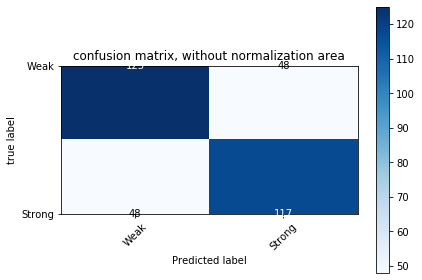

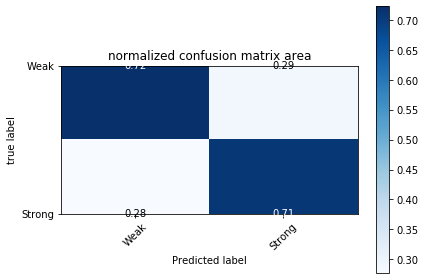

Confusion matrix, without normalization
[[118  55]
 [ 50 115]]
Cormalized confusion matrix
[[0.68 0.33]
 [0.29 0.7 ]]


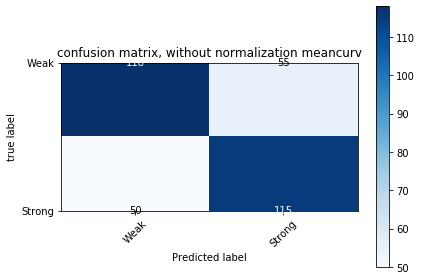

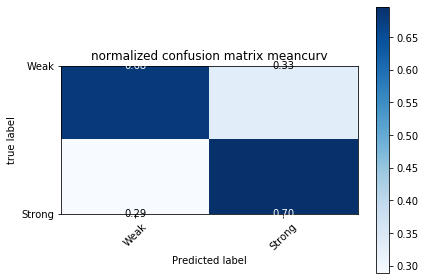

Confusion matrix, without normalization
[[121  52]
 [ 45 120]]
Cormalized confusion matrix
[[0.7  0.32]
 [0.26 0.73]]


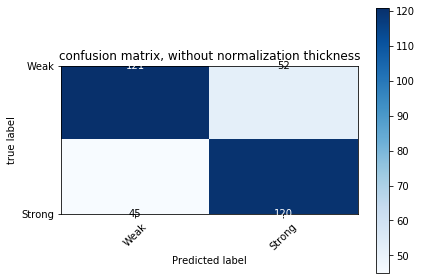

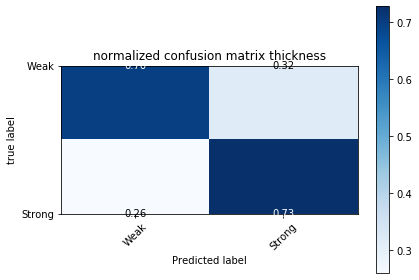

Confusion matrix, without normalization
[[130  43]
 [ 40 125]]
Cormalized confusion matrix
[[0.75 0.26]
 [0.23 0.76]]


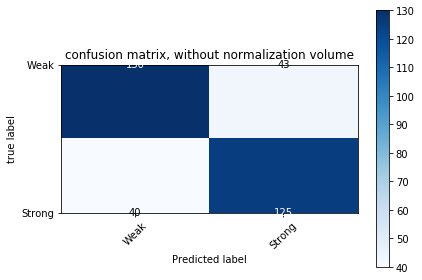

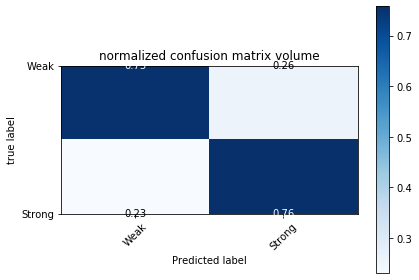

In [273]:
for y_pred_val in y_pred_vals:
    data = y_pred_val['data']
    name = y_pred_val['name']
    
    # Compute Confusion matrix
    cnf_matrix = confusion_matrix(df_y_val['class'].values, data)
    np.set_printoptions(precision=2)

    # Plot non-normalied confusion matrix
    plt.figure()
    plot_confusion_matrix(cnf_matrix, classes=['Weak', 'Strong'],
                         title='confusion matrix, without normalization '+ name)

    # Plot normalized confusion matrix
    plt.figure()
    plot_confusion_matrix(cnf_matrix, classes=['Weak', 'Strong'], normalize=True,
                         title='normalized confusion matrix '+ name)
    plt.show()
